In [1]:
import matplotlib.pyplot as plt
import numpy as np
from torch import Generator
from torch.utils import data
from torchvision.datasets import ImageFolder
import torchvision.transforms.v2.functional as F


def imshow(img):
    npimg = np.array(img)
    fig, ax = plt.subplots(1, 1, figsize=(2, 2))
    ax.imshow(np.transpose(npimg, (1, 2, 0)))
    ax.set_axis_off()
    fig.show()


def resnet_transforms(img):
    image = F.pil_to_tensor(img)
    image = image.float()
    image = image / 255
    image = F.resize(image, [224, 224])
    return image


TRAIN_PERCENTAGE = 0.8
dataset = ImageFolder("/home/diego/Documents/GitHub/deep-learning-research/image-classification/data/eurosat/train", transform=resnet_transforms)
testset = ImageFolder("/home/diego/Documents/GitHub/deep-learning-research/image-classification/data/eurosat/test", transform=resnet_transforms)
trainset, validationset = data.random_split(dataset, [TRAIN_PERCENTAGE, 1-TRAIN_PERCENTAGE], generator=Generator().manual_seed(115249))
queries = [validationset[328][0], validationset[222][0], validationset[143][0], validationset[68][0],
           validationset[16][0], validationset[31][0], validationset[185][0], validationset[267][0],
           validationset[305][0], validationset[452][0]]

In [2]:
from sklearn.neighbors import NearestNeighbors
import torch
from torch import Tensor
from torch.nn import Identity, Linear
from torchvision.models.resnet import ResNet, resnet50, ResNet50_Weights


device = torch.device("cuda:0")


def load_resnet(num_classes: int) -> ResNet:
    model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    model.fc = Linear(model.fc.in_features, num_classes)
    return model.to(device)


def compute_embeddings(encoder: ResNet, data: ImageFolder):
    encoder.fc = Identity() # type: ignore
    encoder.eval()
    embeddings = []
    with torch.no_grad():
        for image, _ in data:
            image = image.unsqueeze(0).to(device)
            outputs = encoder(image)
            embeddings.append(outputs[0].cpu())
    neigh = NearestNeighbors(n_neighbors=15, algorithm="brute")
    embeddings = np.array(embeddings)
    neigh.fit(embeddings)
    return embeddings, neigh



def plot_similarity(query: Tensor, haystack: NearestNeighbors, encoder: ResNet, n: int = 7):
    indices = find_similarity(query, haystack, encoder)
    imshow(query)
    fig, axs = plt.subplots(1, n, figsize=(15, 3))
    for i in range(n):
        index = indices[0][i]
        img = testset[int(index)][0]
        npimg = np.array(img)
        axs[i].imshow(np.transpose(npimg, (1, 2, 0)))
        axs[i].set_axis_off()
    fig.show()


def find_similarity(query: Tensor, haystack: NearestNeighbors, encoder: ResNet):
    with torch.no_grad():
        query = query.unsqueeze(0).to(device)
        query_embedding = encoder(query).cpu()
    distances, indices = haystack.kneighbors(query_embedding)
    return indices

In [3]:
classifier = load_resnet(10)
embeddings, haystack = compute_embeddings(classifier, testset)

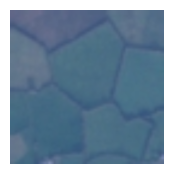

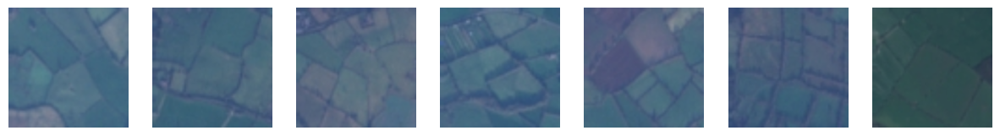

In [4]:
plot_similarity(queries[0], haystack, classifier)

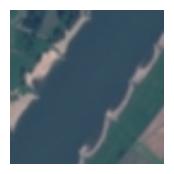

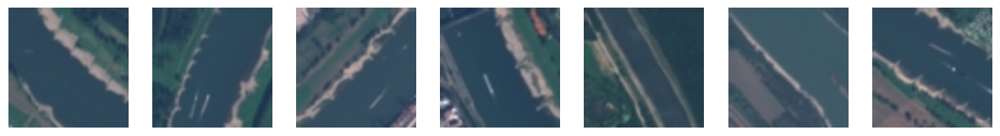

In [5]:
plot_similarity(queries[1], haystack, classifier)

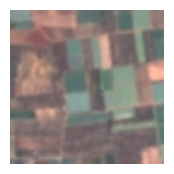

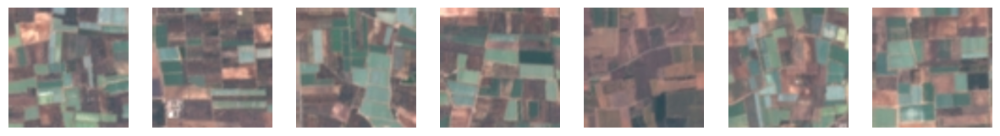

In [6]:
plot_similarity(queries[2], haystack, classifier)

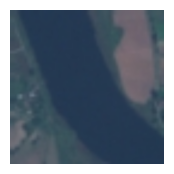

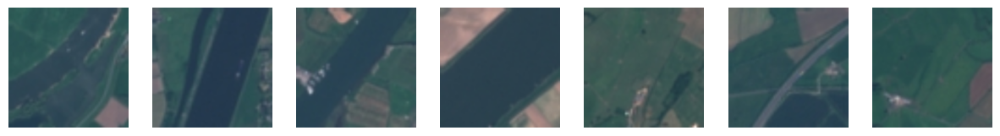

In [7]:
plot_similarity(queries[3], haystack, classifier)

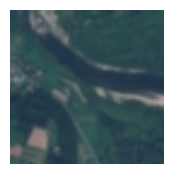

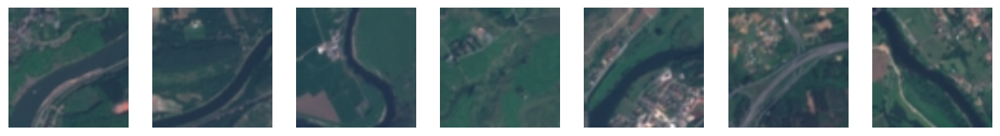

In [8]:
plot_similarity(queries[4], haystack, classifier)

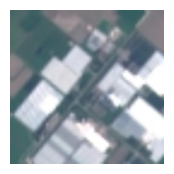

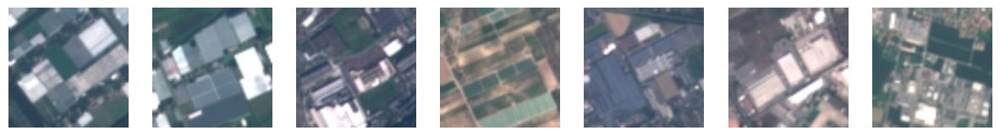

In [9]:
plot_similarity(queries[5], haystack, classifier)

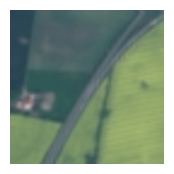

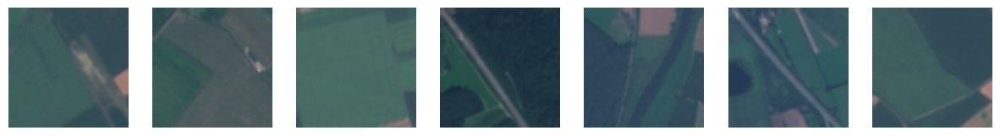

In [10]:
plot_similarity(queries[6], haystack, classifier)

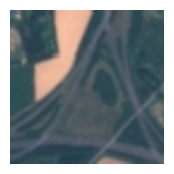

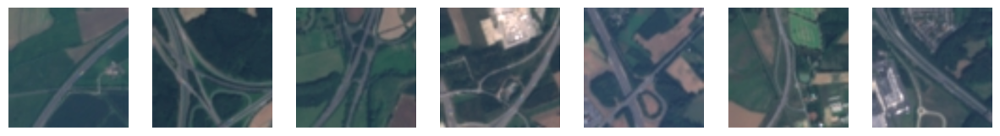

In [11]:
plot_similarity(queries[7], haystack, classifier)

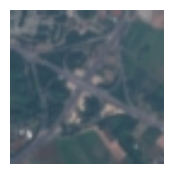

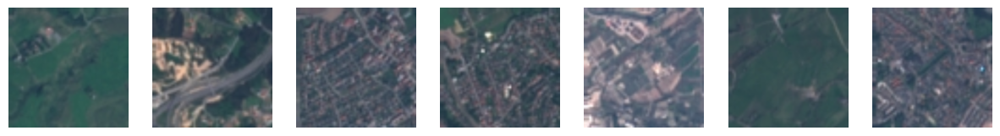

In [12]:
plot_similarity(queries[8], haystack, classifier)

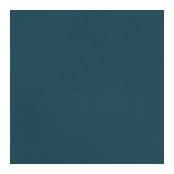

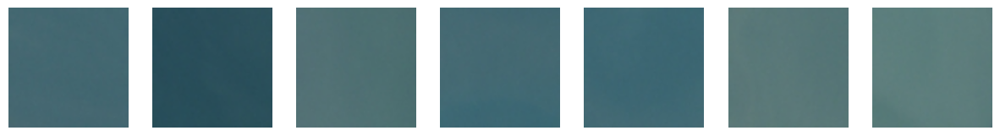

In [13]:
plot_similarity(queries[9], haystack, classifier)

## Trained model

In [14]:
trained_model = load_resnet(10)
trained_model.load_state_dict(torch.load('../image-classification/checkpoints/stage-training-acc-0948.pth', weights_only=True))
embeddings, haystack = compute_embeddings(classifier, testset)

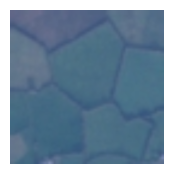

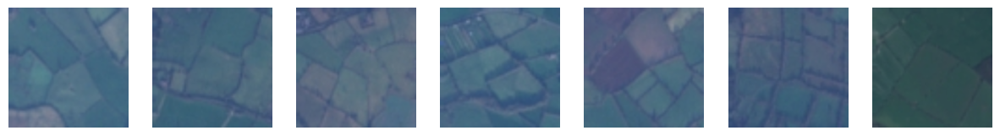

In [15]:
plot_similarity(queries[0], haystack, classifier)

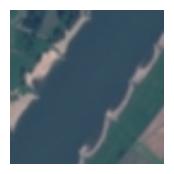

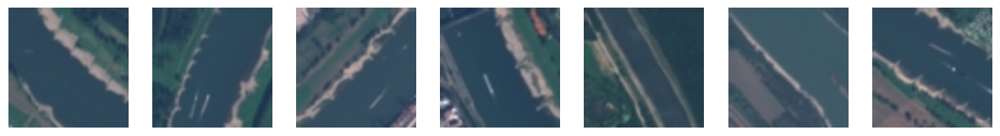

In [16]:
plot_similarity(queries[1], haystack, classifier)

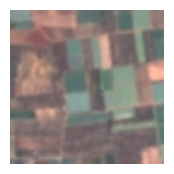

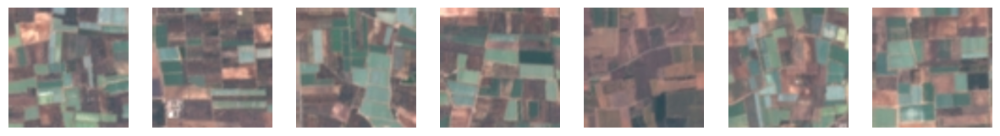

In [17]:
plot_similarity(queries[2], haystack, classifier)

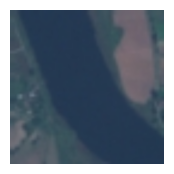

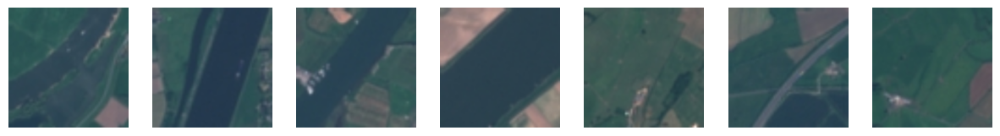

In [18]:
plot_similarity(queries[3], haystack, classifier)

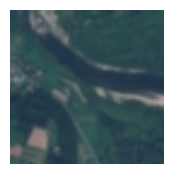

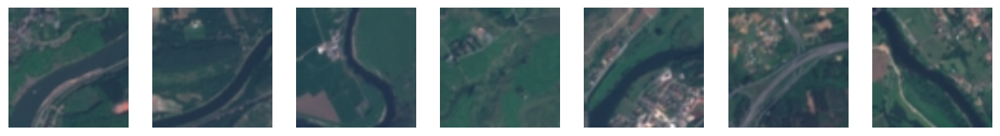

In [19]:
plot_similarity(queries[4], haystack, classifier)

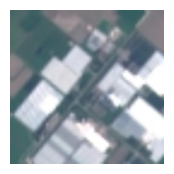

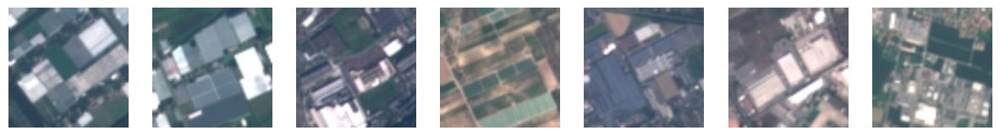

In [20]:
plot_similarity(queries[5], haystack, classifier)

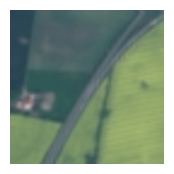

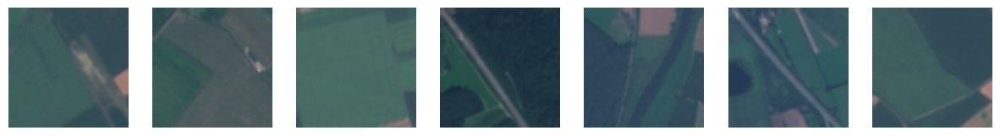

In [21]:
plot_similarity(queries[6], haystack, classifier)

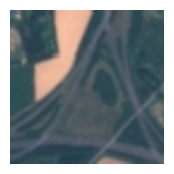

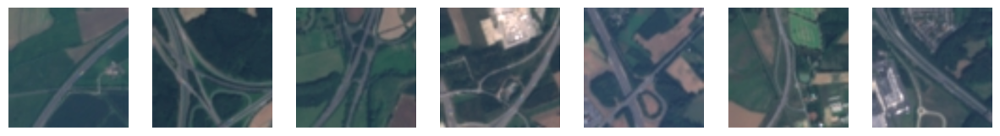

In [22]:
plot_similarity(queries[7], haystack, classifier)

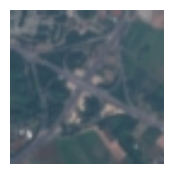

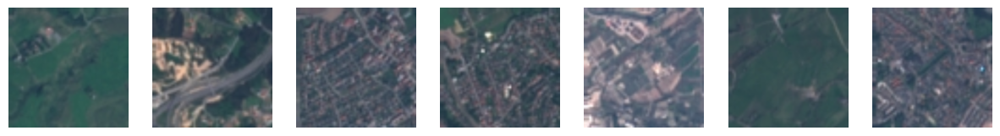

In [23]:
plot_similarity(queries[8], haystack, classifier)

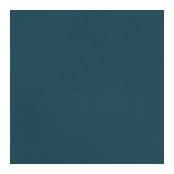

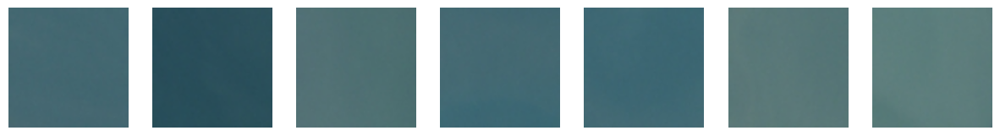

In [24]:
plot_similarity(queries[9], haystack, classifier)

In [25]:
trained_model = load_resnet(10)
trained_model.load_state_dict(torch.load('../image-classification/checkpoints/resnet-eurosat-acc-0897.pth', weights_only=True))
embeddings, haystack = compute_embeddings(classifier, testset)

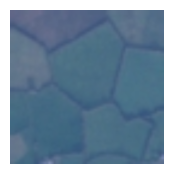

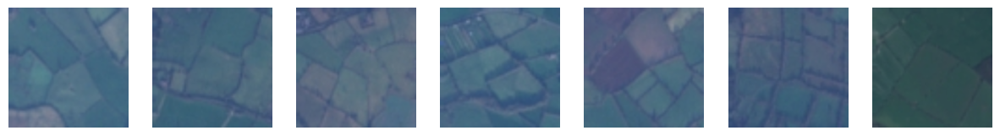

In [26]:
plot_similarity(queries[0], haystack, classifier)

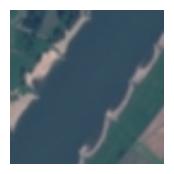

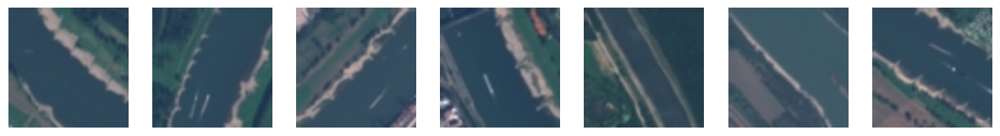

In [27]:
plot_similarity(queries[1], haystack, classifier)

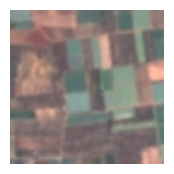

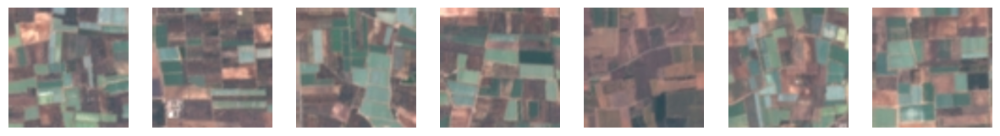

In [28]:
plot_similarity(queries[2], haystack, classifier)

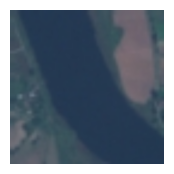

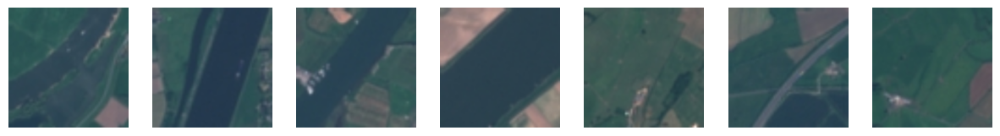

In [29]:
plot_similarity(queries[3], haystack, classifier)

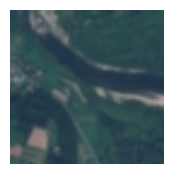

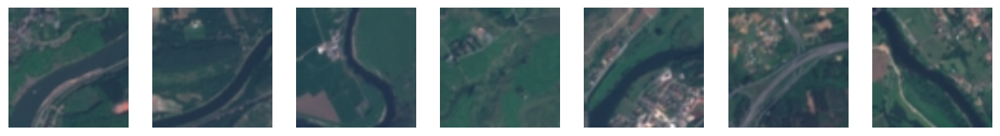

In [30]:
plot_similarity(queries[4], haystack, classifier)

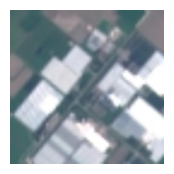

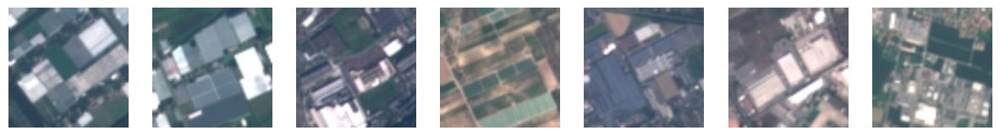

In [31]:
plot_similarity(queries[5], haystack, classifier)

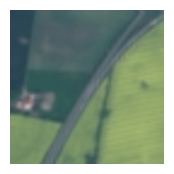

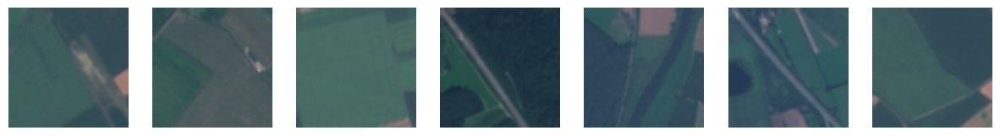

In [32]:
plot_similarity(queries[6], haystack, classifier)

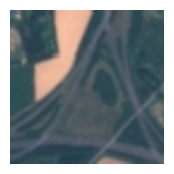

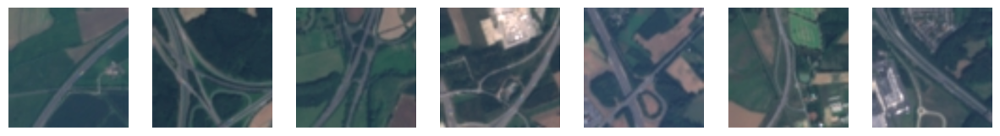

In [33]:
plot_similarity(queries[7], haystack, classifier)

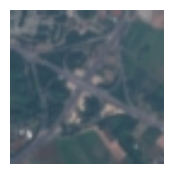

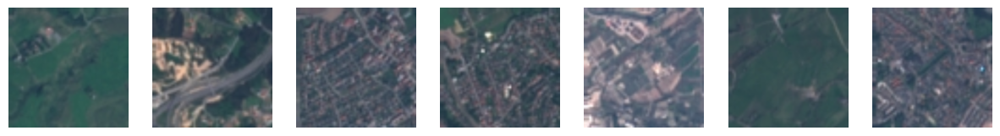

In [34]:
plot_similarity(queries[8], haystack, classifier)

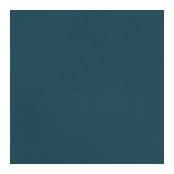

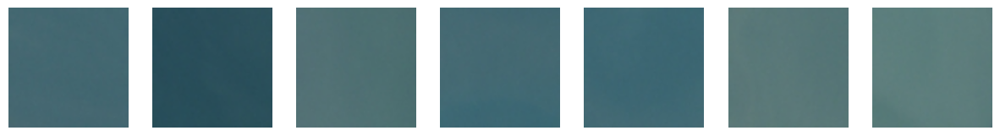

In [35]:
plot_similarity(queries[9], haystack, classifier)

## Using Jaccard

In [36]:
def find_similarity(query: Tensor, haystack: NearestNeighbors, encoder: ResNet):
    with torch.no_grad():
        query = query.unsqueeze(0).to(device)
        query_embedding = encoder(query).cpu()
        indices = haystack.kneighbors(query_embedding, return_distance=False)
    similarities = []
    for i in indices[0]:
        result_embedding = np.expand_dims(embeddings[i], 0)
        local_similar = haystack.kneighbors(result_embedding, return_distance=False)
        jaccard = jaccard_distance(indices[0], local_similar[0])
        similarities.append((i, jaccard))
    similarities.sort(key=lambda x: x[1], reverse=True)
    indices = np.array([x for x, _ in similarities])
    return np.expand_dims(indices, 0)


def jaccard_distance(a: np.ndarray, b: np.ndarray) -> float:
    set_a = set(a)
    set_b = set(b)
    return len(set_a & set_b) / len(set_a | set_b)

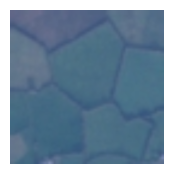

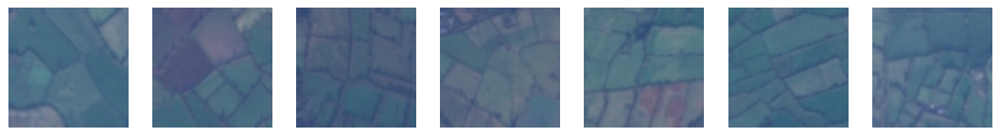

In [37]:
plot_similarity(queries[0], haystack, classifier)

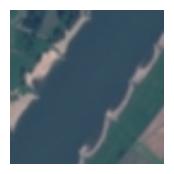

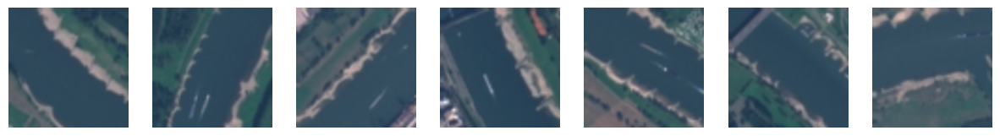

In [38]:
plot_similarity(queries[1], haystack, classifier)

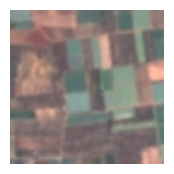

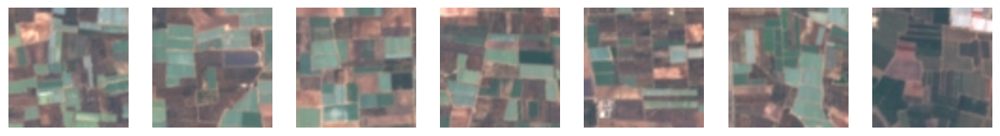

In [39]:
plot_similarity(queries[2], haystack, classifier)

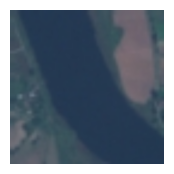

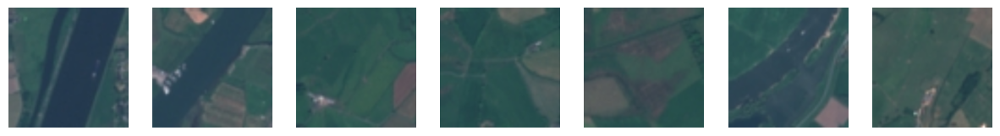

In [40]:
plot_similarity(queries[3], haystack, classifier)

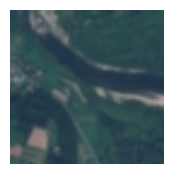

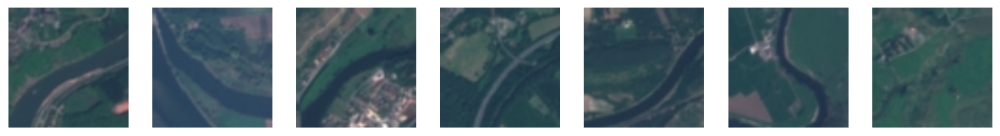

In [41]:
plot_similarity(queries[4], haystack, classifier)

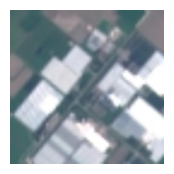

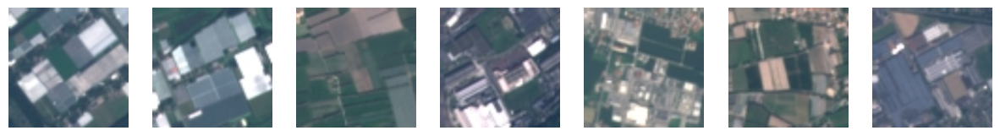

In [42]:
plot_similarity(queries[5], haystack, classifier)

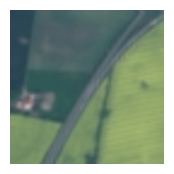

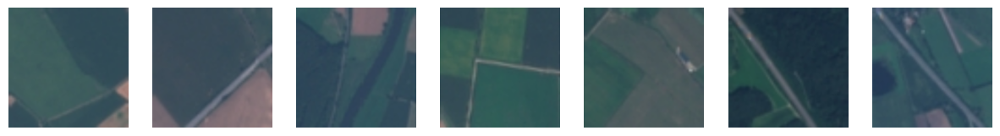

In [43]:
plot_similarity(queries[6], haystack, classifier)

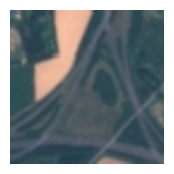

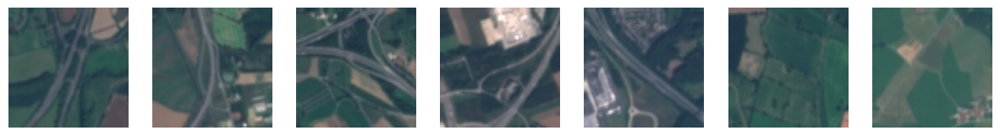

In [44]:
plot_similarity(queries[7], haystack, classifier)

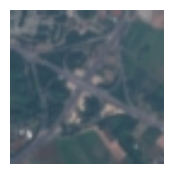

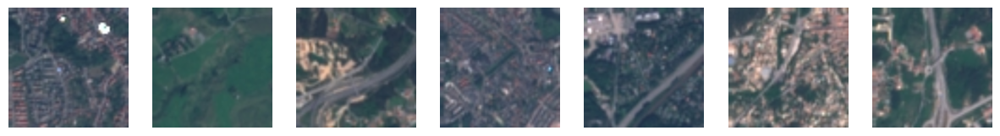

In [45]:
plot_similarity(queries[8], haystack, classifier)

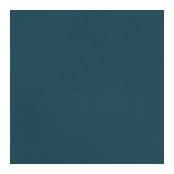

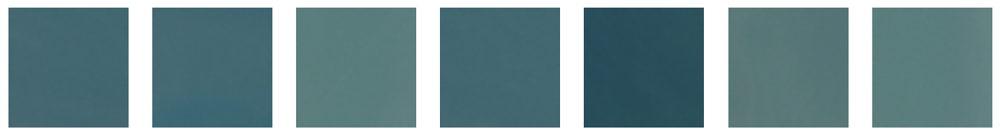

In [46]:
plot_similarity(queries[9], haystack, classifier)

In [47]:
trained_model = load_resnet(10)
trained_model.load_state_dict(torch.load('../image-classification/checkpoints/stage-training-acc-0948.pth', weights_only=True))
embeddings, haystack = compute_embeddings(classifier, testset)

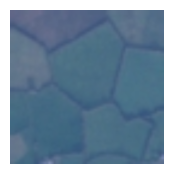

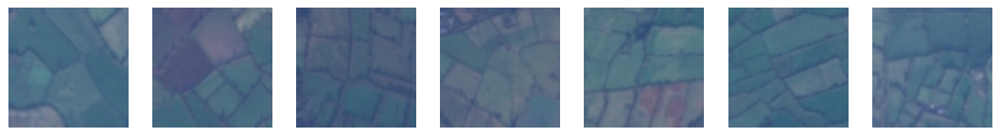

In [48]:
plot_similarity(queries[0], haystack, classifier)

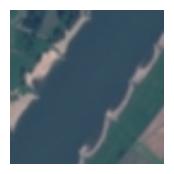

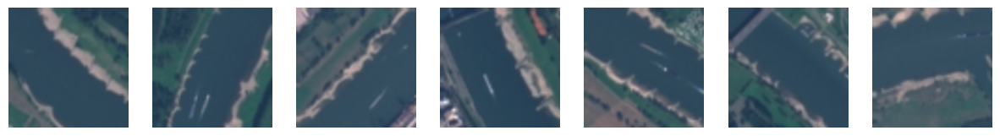

In [49]:
plot_similarity(queries[1], haystack, classifier)

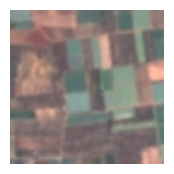

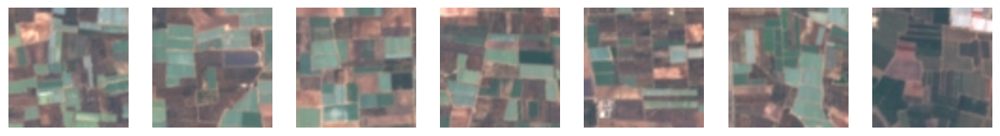

In [50]:
plot_similarity(queries[2], haystack, classifier)

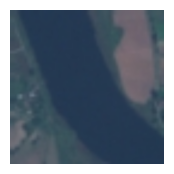

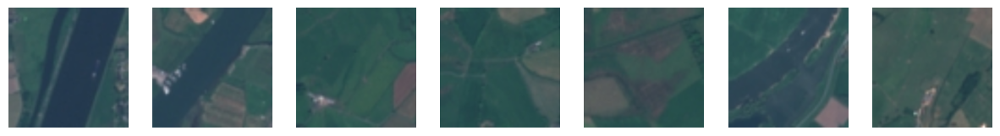

In [51]:
plot_similarity(queries[3], haystack, classifier)

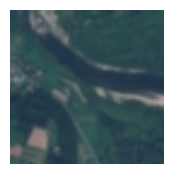

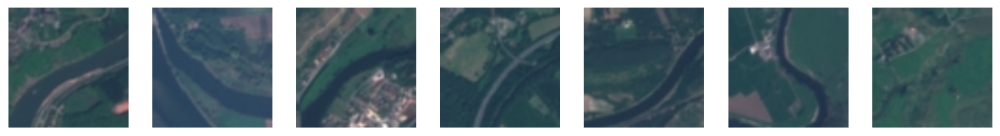

In [52]:
plot_similarity(queries[4], haystack, classifier)

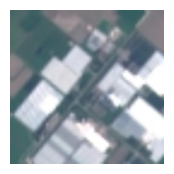

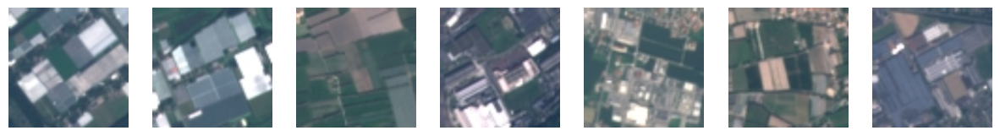

In [53]:
plot_similarity(queries[5], haystack, classifier)

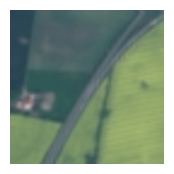

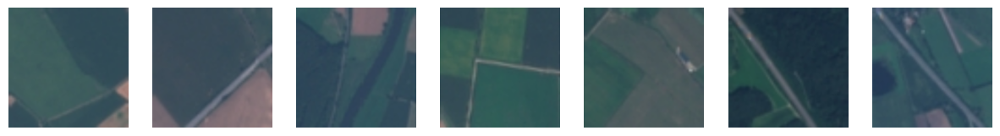

In [54]:
plot_similarity(queries[6], haystack, classifier)

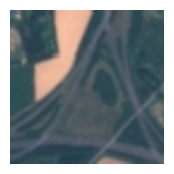

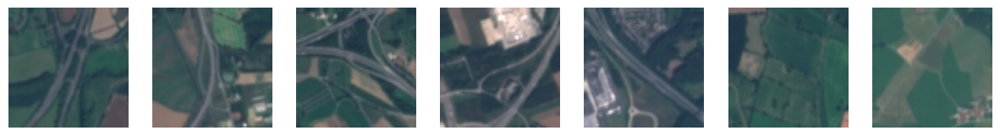

In [55]:
plot_similarity(queries[7], haystack, classifier)

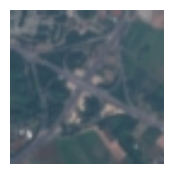

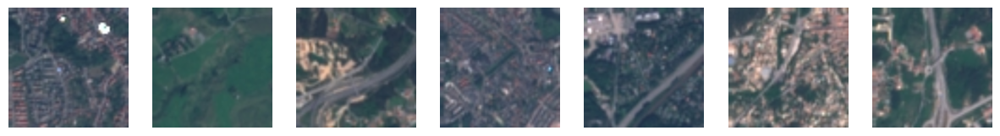

In [56]:
plot_similarity(queries[8], haystack, classifier)

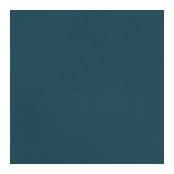

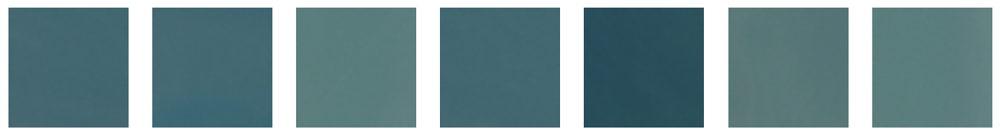

In [57]:
plot_similarity(queries[9], haystack, classifier)

In [58]:
trained_model = load_resnet(10)
trained_model.load_state_dict(torch.load('../image-classification/checkpoints/resnet-eurosat-acc-0897.pth', weights_only=True))
embeddings, haystack = compute_embeddings(classifier, testset)

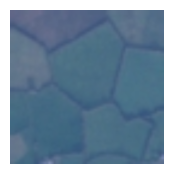

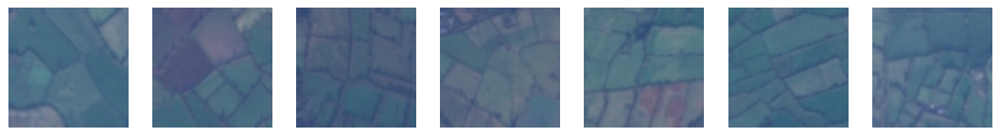

In [59]:
plot_similarity(queries[0], haystack, classifier)

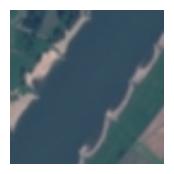

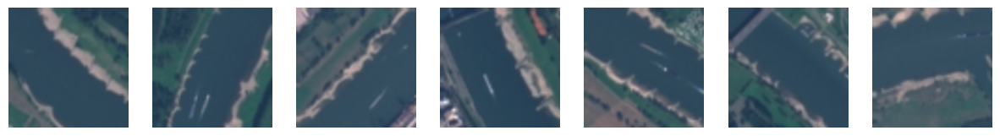

In [60]:
plot_similarity(queries[1], haystack, classifier)

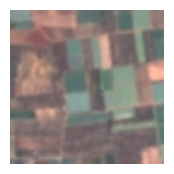

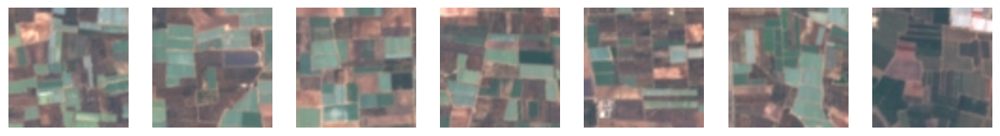

In [61]:
plot_similarity(queries[2], haystack, classifier)

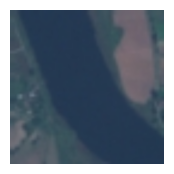

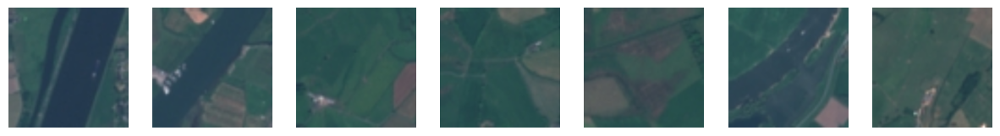

In [62]:
plot_similarity(queries[3], haystack, classifier)

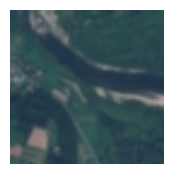

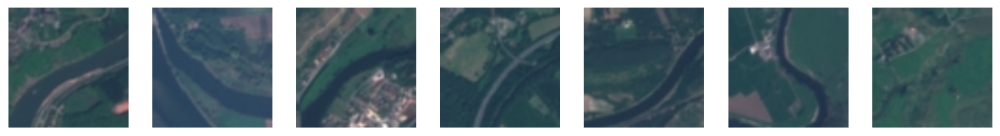

In [63]:
plot_similarity(queries[4], haystack, classifier)

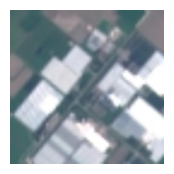

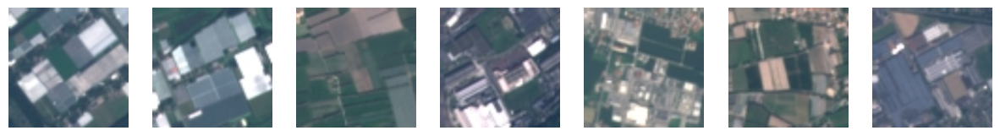

In [64]:
plot_similarity(queries[5], haystack, classifier)

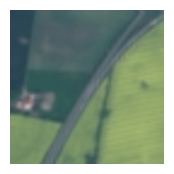

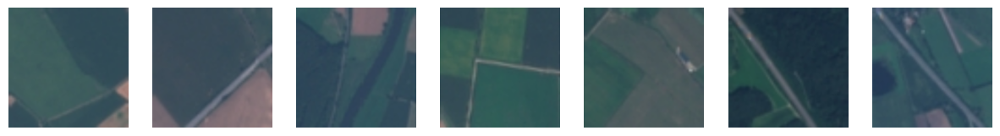

In [65]:
plot_similarity(queries[6], haystack, classifier)

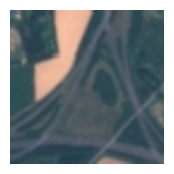

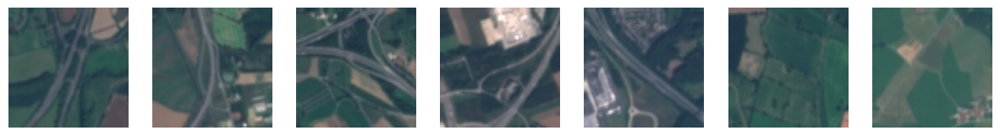

In [66]:
plot_similarity(queries[7], haystack, classifier)

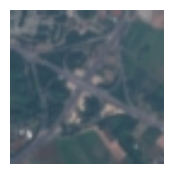

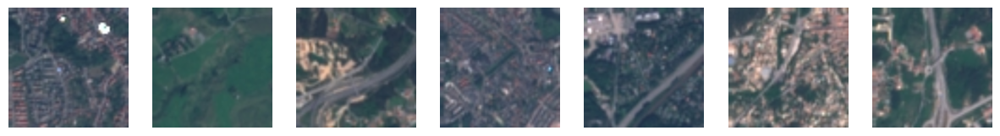

In [67]:
plot_similarity(queries[8], haystack, classifier)

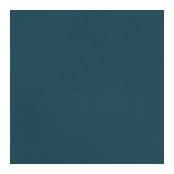

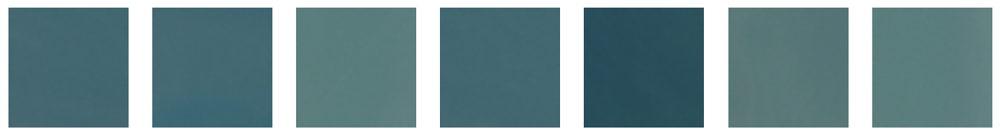

In [68]:
plot_similarity(queries[9], haystack, classifier)